In [ ]:
!pip install -U opencv-python deepface

In [2]:
!pip show opencv-python

Name: opencv-python
Version: 4.11.0.86
Summary: Wrapper package for OpenCV python bindings.
Home-page: https://github.com/opencv/opencv-python
Author: 
Author-email: 
License: Apache 2.0
Location: /usr/local/lib/python3.11/dist-packages
Requires: numpy
Required-by: deepface, dopamine_rl, imgaug, retina-face


In [3]:
import cv2
from google.colab.patches import cv2_imshow

# Haar Cascade Viola Jones

Face 1 - Centro de massa: (x=516, y=345)
Face 2 - Centro de massa: (x=1178, y=342)
Face 3 - Centro de massa: (x=843, y=343)
Face 4 - Centro de massa: (x=182, y=344)
Face 5 - Centro de massa: (x=515, y=677)
Face 6 - Centro de massa: (x=848, y=676)
Face 7 - Centro de massa: (x=184, y=676)
Face 8 - Centro de massa: (x=1182, y=678)


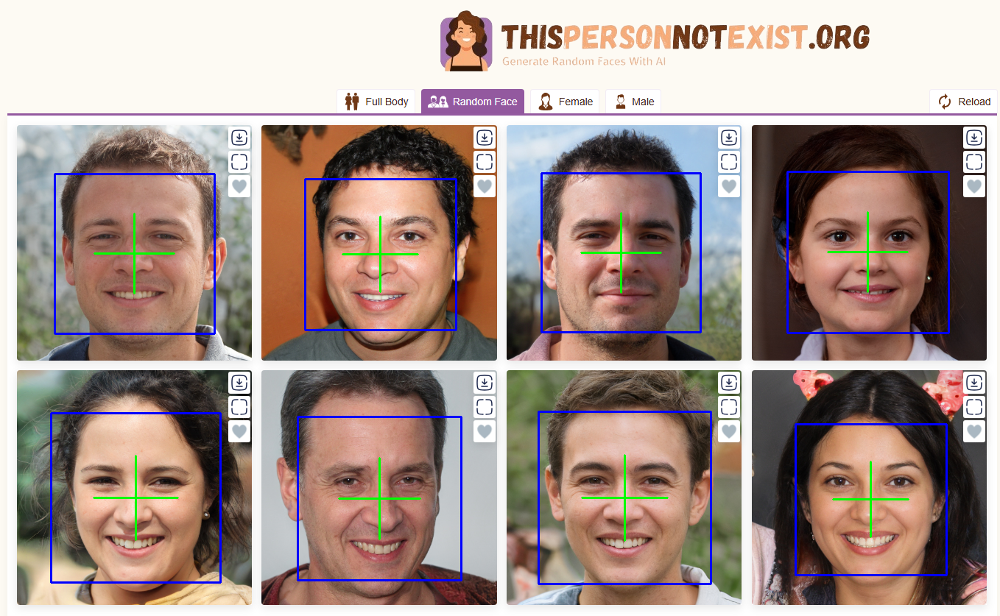

In [4]:
# Carregar o classificador de face pré-treinado
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')


img = cv2.imread('imagem1.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

# Detectar faces na imagem
# Desenhar retângulos em torno das faces detectadas
for i, (x, y, w, h) in enumerate(faces):
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # Calcular o centro de massa
    center_x = x + w // 2
    center_y = y + h // 2


    print(f"Face {i+1} - Centro de massa: (x={center_x}, y={center_y})")


    cross_size = min(w, h) // 4
    cv2.line(img, (center_x - cross_size, center_y), (center_x + cross_size, center_y), (0, 255, 0), 2)
    cv2.line(img, (center_x, center_y - cross_size), (center_x, center_y + cross_size), (0, 255, 0), 2)


cv2_imshow( img)



# Yunet

baixe os pesos do modelos

In [5]:
! wget https://huggingface.co/spaces/sam749/YuNet-face-detection/resolve/main/face_detection_yunet_2023mar.onnx


--2025-01-25 18:48:53--  https://huggingface.co/spaces/sam749/YuNet-face-detection/resolve/main/face_detection_yunet_2023mar.onnx
Resolving huggingface.co (huggingface.co)... 65.8.243.16, 65.8.243.92, 65.8.243.46, ...
Connecting to huggingface.co (huggingface.co)|65.8.243.16|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs-us-1.hf.co/repos/17/65/1765bda9171c6dd351fd01adcdf1da1b018b8c11c1b74f509e980ffc4030947b/8f2383e4dd3cfbb4553ea8718107fc0423210dc964f9f4280604804ed2552fa4?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27face_detection_yunet_2023mar.onnx%3B+filename%3D%22face_detection_yunet_2023mar.onnx%22%3B&Expires=1737834533&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTczNzgzNDUzM319LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy11cy0xLmhmLmNvL3JlcG9zLzE3LzY1LzE3NjViZGE5MTcxYzZkZDM1MWZkMDFhZGNkZjFkYTFiMDE4YjhjMTFjMWI3NGY1MDllOTgwZmZjNDAzMDk0N2IvOGYyMzgzZTRkZDNjZmJiNDU1M2VhODcxODEwN2ZjMDQyM

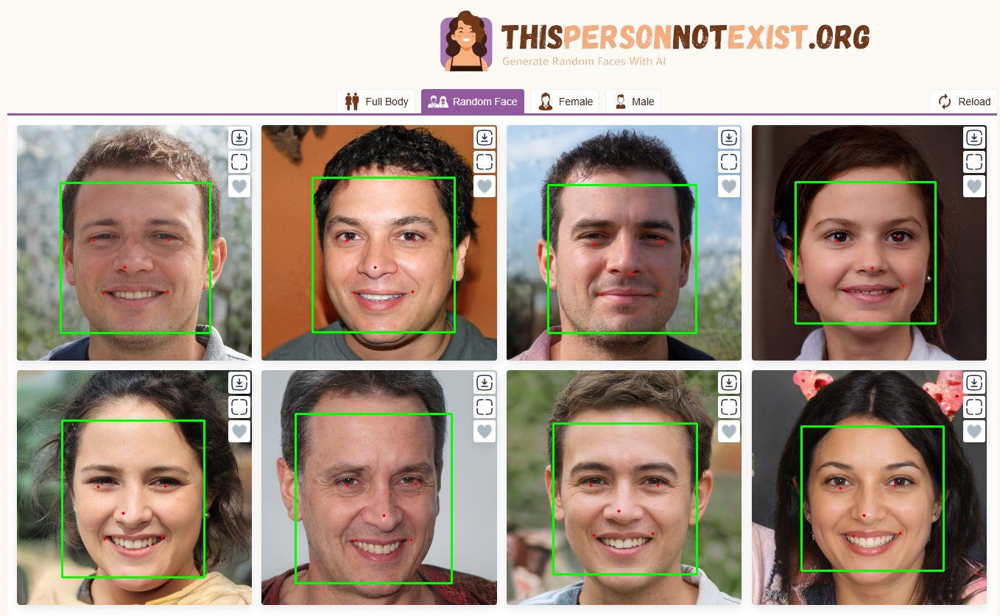

In [6]:
import cv2 as cv
import numpy as np

# Carregar o modelo YuNet
model = "/content/face_detection_yunet_2023mar.onnx"
input_size = (640,640)


face_detector = cv.FaceDetectorYN.create(
    model, "", input_size, score_threshold=0.8, nms_threshold=0.3,
    top_k=5000, backend_id=cv.dnn.DNN_BACKEND_OPENCV, target_id=cv.dnn.DNN_TARGET_CPU
)




# Carregar a imagem
image_path = "/content/imagem1.jpg"
frame = cv.imread(image_path)

if frame is None:
    print(f"Erro ao carregar a imagem {image_path}")
else:
    # Redimensionar a imagem para o tamanho de entrada do modelo
    resized_frame = cv.resize(frame, input_size)

    # Realizar a detecção facial na imagem redimensionada
    faces = face_detector.detect(resized_frame)

    if faces[1] is not None:
        for face in faces[1]:
            # Escalar as coordenadas de volta para o tamanho original da imagem
            face = face.astype(int)
            x, y, w, h = face[:4]
            x = int(x * frame.shape[1] / input_size[0])
            y = int(y * frame.shape[0] / input_size[1])
            w = int(w * frame.shape[1] / input_size[0])
            h = int(h * frame.shape[0] / input_size[1])

            # Desenhar a caixa delimitadora ao redor do rosto
            cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

            # Desenhar os pontos dos olhos, nariz e boca
            landmarks = face[4:14].reshape((5, 2))
            for (lx, ly) in landmarks:
                lx = int(lx * frame.shape[1] / input_size[0])
                ly = int(ly * frame.shape[0] / input_size[1])
                cv.circle(frame, (lx, ly), 2, (0, 0, 255), -1)

    # Exibir a imagem com as detecções
    cv2_imshow( frame)



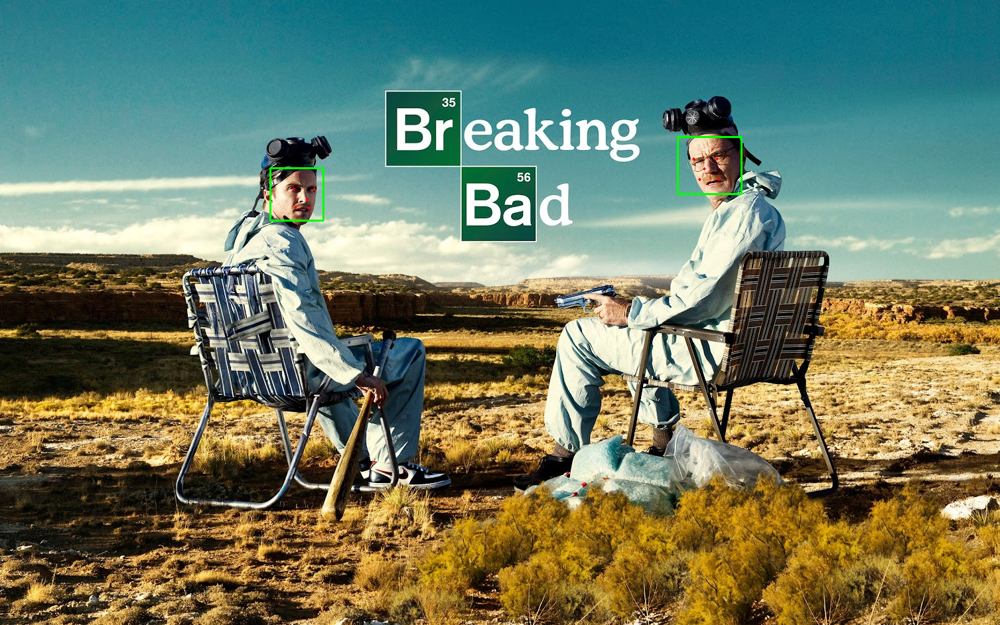

In [7]:
# Carregar a imagem
image_path = "/content/imagem2.jpg"
frame = cv.imread(image_path)

if frame is None:
    print(f"Erro ao carregar a imagem {image_path}")
else:
    # Redimensionar a imagem para o tamanho de entrada do modelo
    resized_frame = cv.resize(frame, input_size)

    # Realizar a detecção facial na imagem redimensionada
    faces = face_detector.detect(resized_frame)

    if faces[1] is not None:
        for face in faces[1]:
            # Escalar as coordenadas de volta para o tamanho original da imagem
            face = face.astype(int)
            x, y, w, h = face[:4]
            x = int(x * frame.shape[1] / input_size[0])
            y = int(y * frame.shape[0] / input_size[1])
            w = int(w * frame.shape[1] / input_size[0])
            h = int(h * frame.shape[0] / input_size[1])

            # Desenhar a caixa delimitadora ao redor do rosto
            cv.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

            # Desenhar os pontos dos olhos, nariz e boca
            landmarks = face[4:14].reshape((5, 2))
            for (lx, ly) in landmarks:
                lx = int(lx * frame.shape[1] / input_size[0])
                ly = int(ly * frame.shape[0] / input_size[1])
                cv.circle(frame, (lx, ly), 2, (0, 0, 255), -1)

    # Exibir a imagem com as detecções
    cv2_imshow( frame)

# Deep Face

In [8]:
import cv2
import numpy as np
from deepface import DeepFace

imagem = cv2.imread('imagem2.jpg')
resultado = DeepFace.analyze(img_path=imagem,
        actions=["age", "emotion"],
        enforce_detection=False,detector_backend="retinaface")



25-01-25 18:49:34 - Directory /root/.deepface has been created
25-01-25 18:49:34 - Directory /root/.deepface/weights has been created
25-01-25 18:49:38 - retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /root/.deepface/weights/retinaface.h5
100%|██████████| 119M/119M [00:01<00:00, 88.8MB/s]
Action: age:   0%|          | 0/2 [00:00<?, ?it/s]    

25-01-25 18:49:54 - age_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/age_model_weights.h5
To: /root/.deepface/weights/age_model_weights.h5

  0%|          | 0.00/539M [00:00<?, ?B/s]
  1%|          | 4.19M/539M [00:00<00:12, 41.2MB/s]
  6%|▌         | 30.9M/539M [00:00<00:02, 172MB/s] 
 11%|█         | 58.2M/539M [00:00<00:02, 217MB/s]
 16%|█▌        | 84.4M/539M [00:00<00:01, 233MB/s]
 20%|██        | 108M/539M [00:00<00:01, 219MB/s] 
 24%|██▍       | 131M/539M [00:00<00:01, 216MB/s]
 28%|██▊       | 153M/539M [00:00<00:01, 218MB/s]
 33%|███▎      | 175M/539M [00:00<00:01, 217MB/s]
 37%|███▋      | 199M/539M [00:00<00:01, 224MB/s]
 41%|████▏     | 223M/539M [00:01<00:01, 226MB/s]
 46%|████▌     | 247M/539M [00:01<00:01, 230MB/s]
 51%|█████     | 273M/539M [00:01<00:01, 237MB/s]
 55%|█████▌    | 297M/539M [00:01<00:01, 232MB/s]
 59%|█████▉    | 320M/539M [00:01<00:00, 228MB/s]
 64%|██████▎   | 343M/539M [00:01<00:00, 227MB/s]
 68%|██████▊   | 368M/539M [00:01<00:00, 

25-01-25 18:50:00 - facial_expression_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /root/.deepface/weights/facial_expression_model_weights.h5

  0%|          | 0.00/5.98M [00:00<?, ?B/s]
100%|██████████| 5.98M/5.98M [00:00<00:00, 49.5MB/s]
Action: emotion: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]


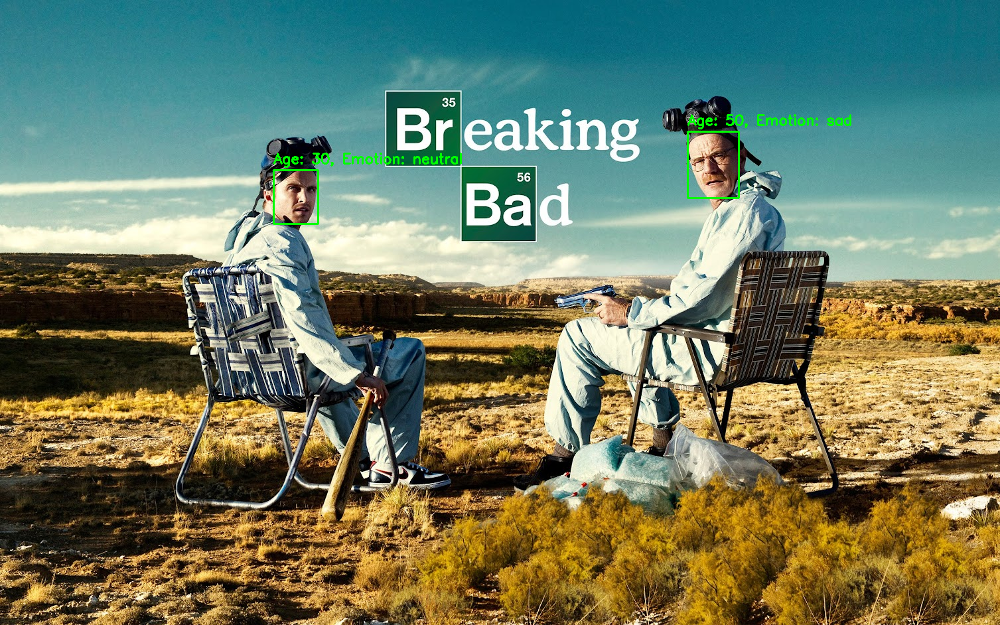

In [9]:
# Iterar sobre cada rosto detectado (mesmo que apenas um)
for face in resultado:
    # Extrair informações
    age = face['age']
    emotion = face['dominant_emotion']

    # Coordenadas da caixa delimitadora (x, y, w, h)
    x = face['region']['x']
    y = face['region']['y']
    w = face['region']['w']
    h = face['region']['h']

    # Desenhar retângulo ao redor do rosto
    cv2.rectangle(
        img=imagem,
        pt1=(x, y),
        pt2=(x + w, y + h),
        color=(0, 255, 0),  # Cor verde (BGR)
        thickness=2
    )

    # Texto com idade e emoção
    texto = f"Age: {age}, Emotion: {emotion}"

    # Posição do texto (acima da caixa)
    posicao_texto = (x, y - 10)

    # Adicionar texto à imagem
    cv2.putText(
        img=imagem,
        text=texto,
        org=posicao_texto,
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.7,
        color=(0, 255, 0),  # Cor verde
        thickness=2
    )


cv2_imshow(imagem)

Action: emotion: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]


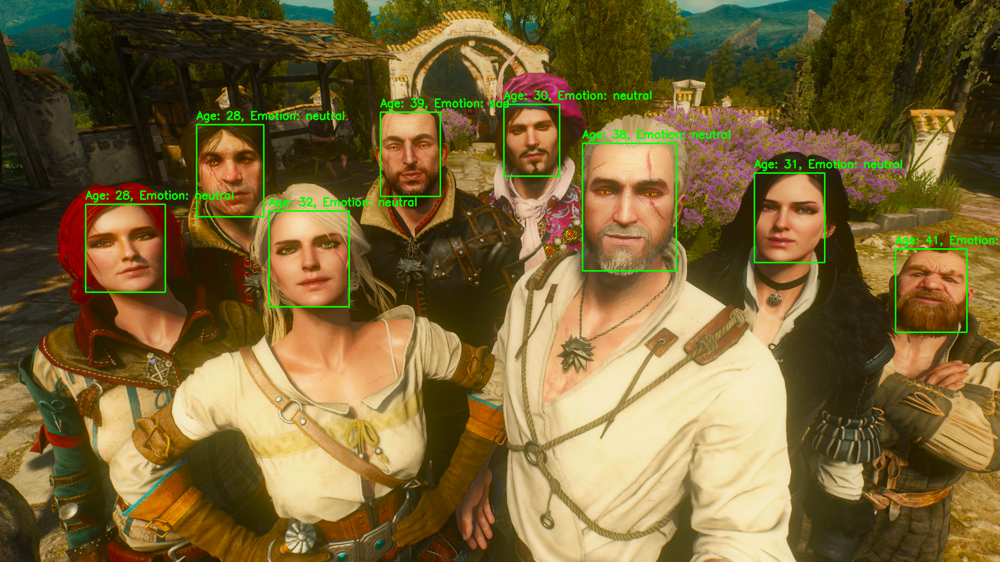

In [10]:
import cv2
import numpy as np
from deepface import DeepFace

imagem = cv2.imread('/content/the_witcher3.png')
resultado = DeepFace.analyze(img_path=imagem,
        actions=["age", "emotion"],
        enforce_detection=False,detector_backend="retinaface")

for face in resultado:
    x, y, w, h = face['region']['x'], face['region']['y'], face['region']['w'], face['region']['h']
    cv2.rectangle(imagem, (x, y), (x + w, y + h), (0,255,0), 2)
    cv2.putText(imagem, f"Age: {face['age']}, Emotion: {face['dominant_emotion']}", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 2)
cv2_imshow(imagem)